Dataset Link: https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification/data

## Importing Libraries

In [46]:
import os
import librosa
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPool2D, Flatten, Dense,Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.image import resize
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
pwd

'C:\\Users\\SARIN\\OneDrive\\Desktop'

### Visualizing Single Audio

In [3]:
random_file_name = r"C:\Users\SARIN\OneDrive\Desktop\Data\genres_original\blues\blues.00000.wav"

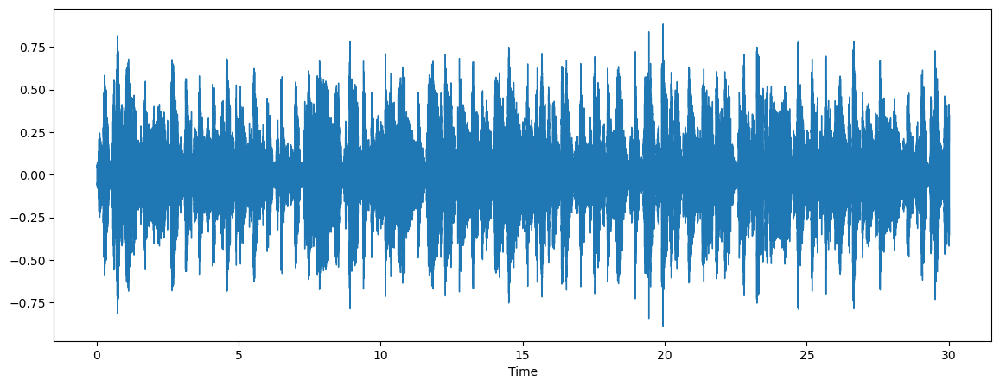

In [4]:
x, sr = librosa.load(random_file_name, sr=44100)
plt.figure(figsize=(14, 5))
librosa.display.waveshow(x, sr=sr)

#### Playing Sound

In [6]:
from IPython.display import Audio
Audio(data=x, rate=sr)

### Doing Visualization on chunks of audio

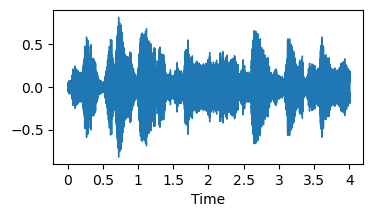

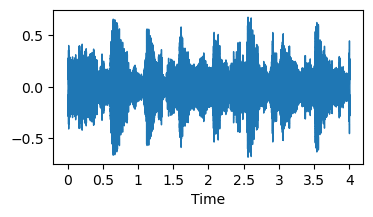

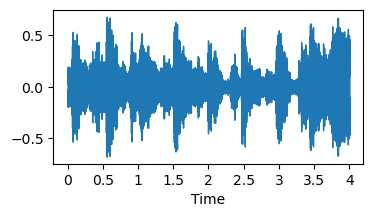

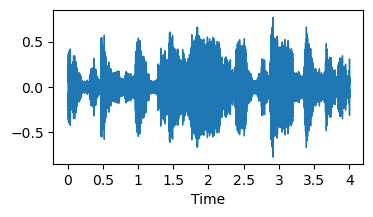

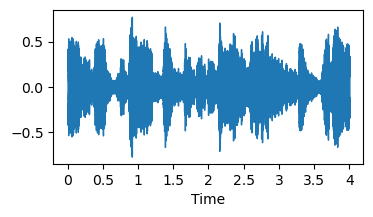

...

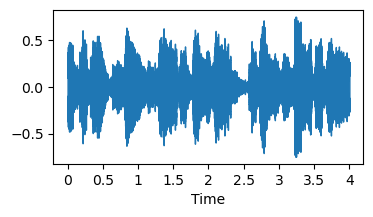

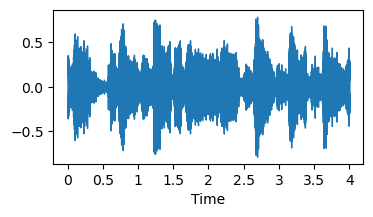

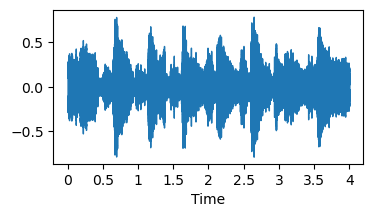

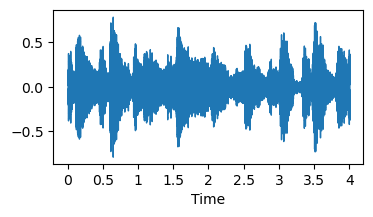

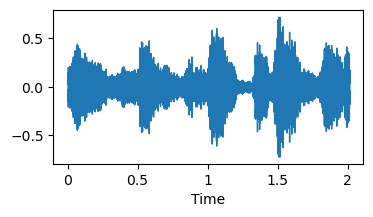

In [5]:
audio_path = r"C:\Users\SARIN\OneDrive\Desktop\Data\genres_original\blues\blues.00000.wav"
y, sr = librosa.load(audio_path, sr=None)  # sr=None to keep the original sampling rate

# Define the duration of each chunk and overlap
chunk_duration = 4  # seconds
overlap_duration = 2  # seconds

# Convert durations to samples
chunk_samples = chunk_duration * sr
overlap_samples = overlap_duration * sr

# Calculate the number of chunks
num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

# Iterate over each chunk
for i in range(num_chunks):
    # Calculate start and end indices of the chunk
    start = i * (chunk_samples - overlap_samples)
    end = start + chunk_samples
    
    # Extract the chunk of audio
    chunk = y[start:end]
    plt.figure(figsize=(4, 2))
    librosa.display.waveshow(chunk, sr=sr)
    plt.show()
    

### Melspectrogram Visualization

In [11]:
#Plotting Melspectrogram of Entire audio
def plot_melspectrogram(y,sr):
    # Compute the spectrogram
    spectrogram = librosa.feature.melspectrogram(y=y, sr=sr)
    # Convert to decibels (log scale)
    spectrogram_db = librosa.power_to_db(spectrogram, ref=np.max)
    # Visualize the spectrogram
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    plt.tight_layout()
    plt.show()

In [6]:
def plot_melspectrogram_chunks(y,sr):
    # Define the duration of each chunk and overlap
    chunk_duration = 4  # seconds
    overlap_duration = 2  # seconds
    
    # Convert durations to samples
    chunk_samples = chunk_duration * sr
    overlap_samples = overlap_duration * sr
    
    # Calculate the number of chunks
    num_chunks = int(np.ceil((len(y) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
    
    # Iterate over each chunk
    for i in range(num_chunks):
        # Calculate start and end indices of the chunk
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples
        
        # Extract the chunk of audio
        chunk = y[start:end]
        
        # Compute the Mel spectrogram for the chunk
        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sr)
        print(mel_spectrogram.shape)
        spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
        # Visualize the spectrogram
        plt.figure(figsize=(10, 4))
        librosa.display.specshow(spectrogram_db, sr=sr, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Spectrogram')
        plt.tight_layout()
        plt.show()

(128, 173)


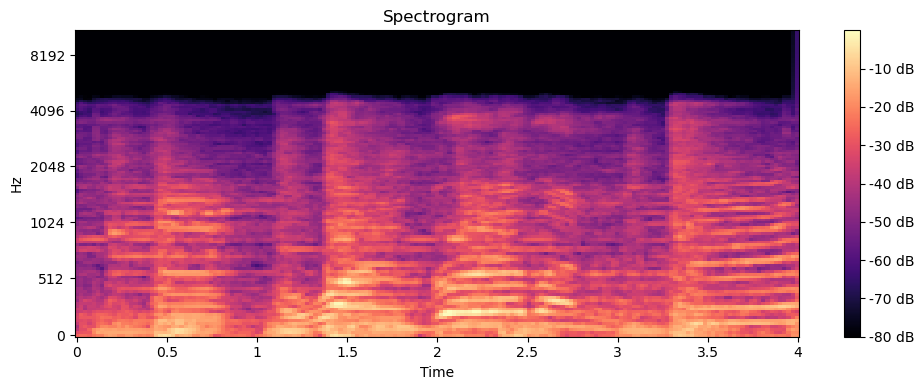

(128, 173)


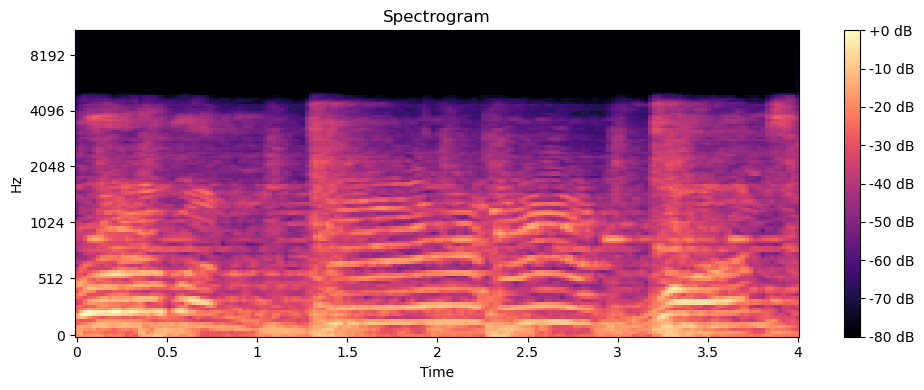

(128, 173)


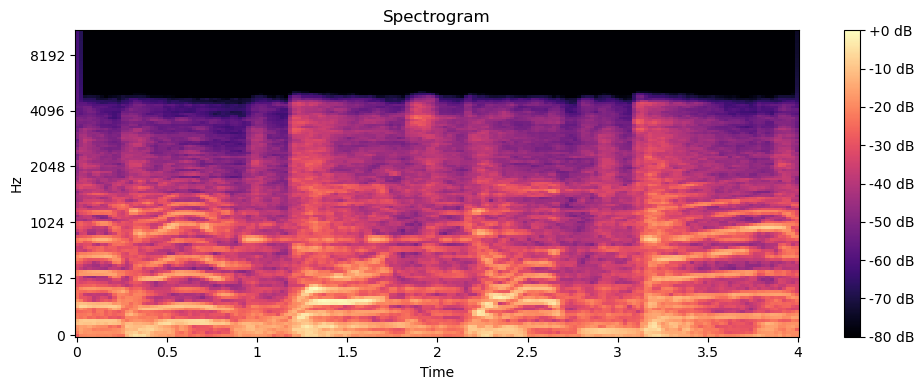

(128, 173)


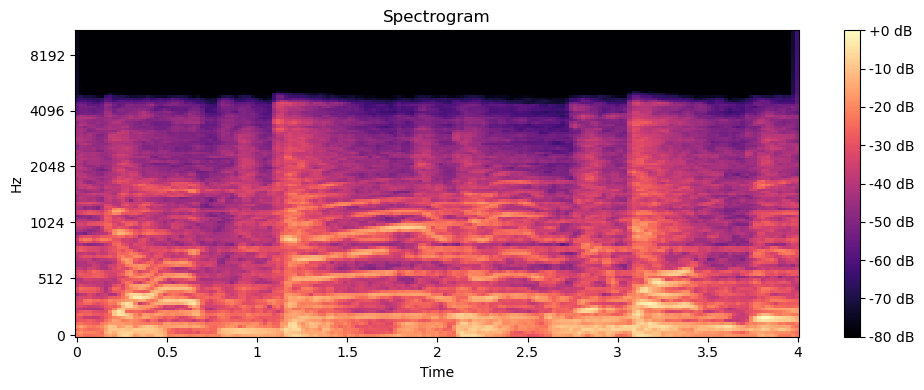

(128, 173)


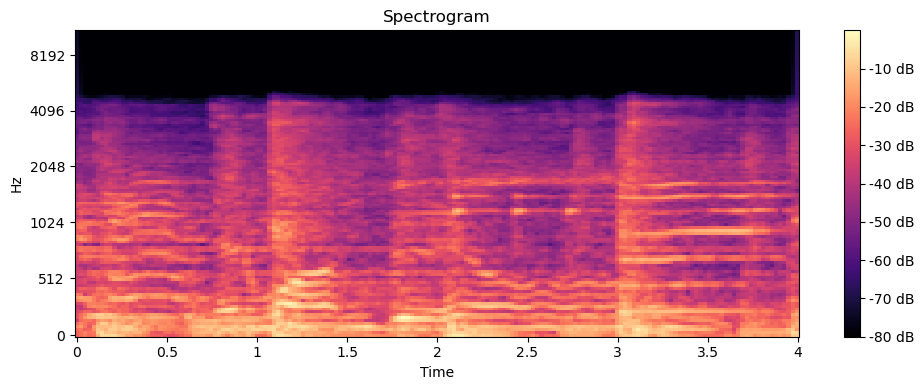

(128, 173)


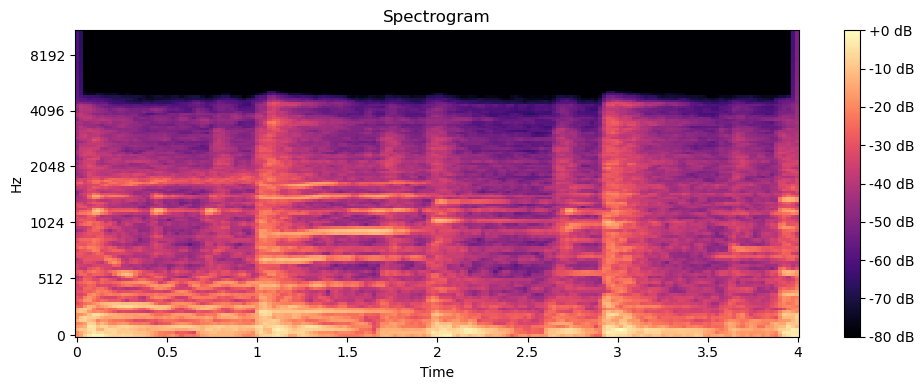

(128, 173)


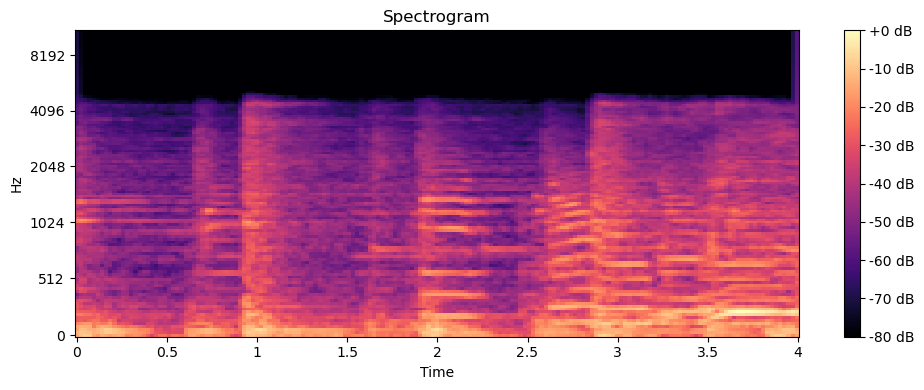

(128, 173)


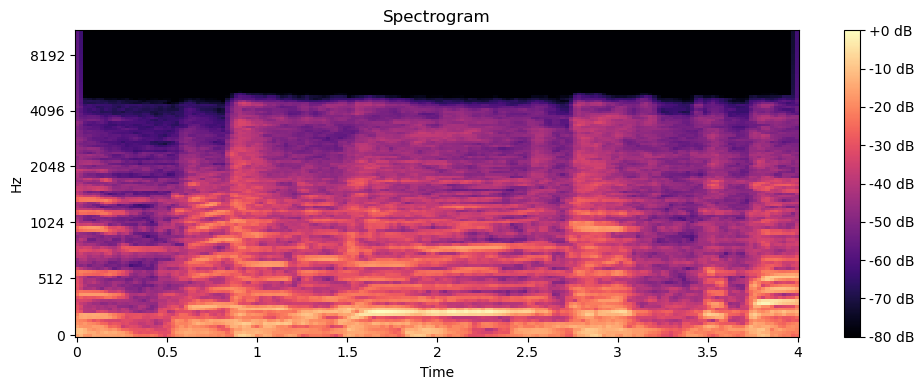

(128, 173)


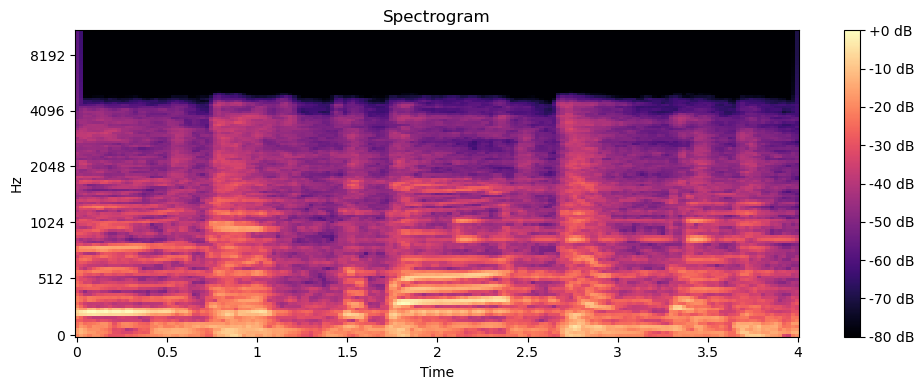

(128, 173)


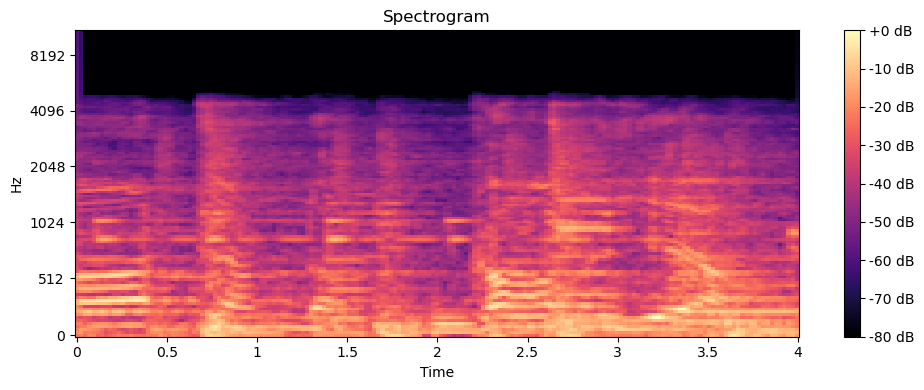

(128, 173)


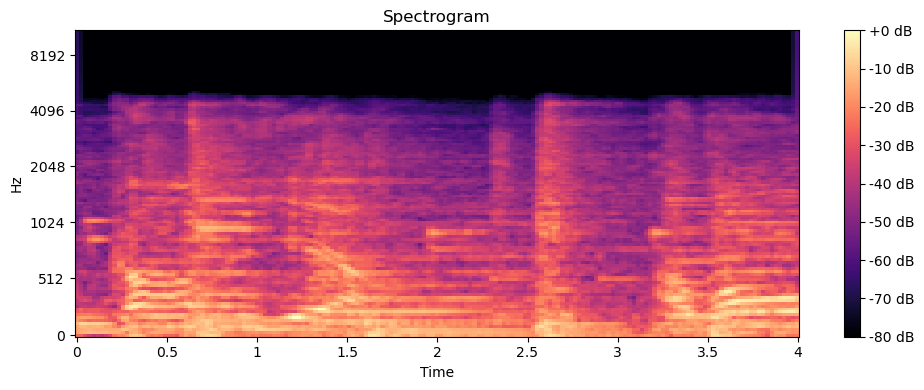

(128, 173)


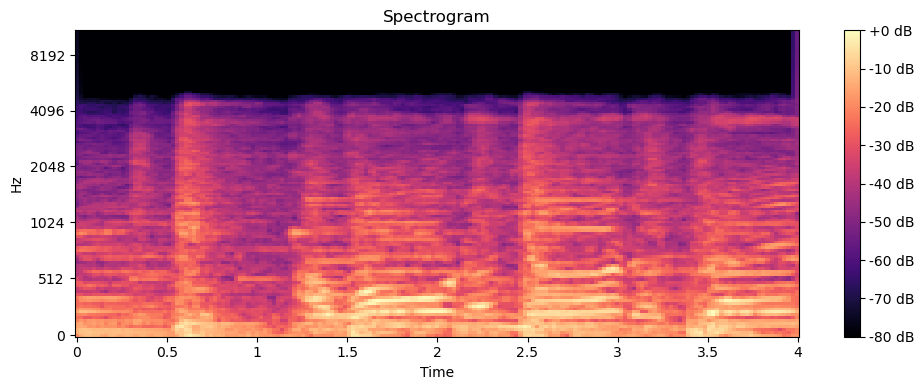

(128, 173)


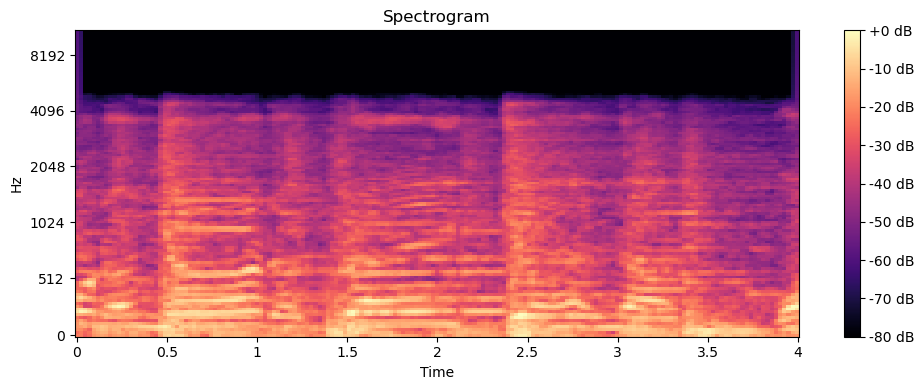

(128, 173)


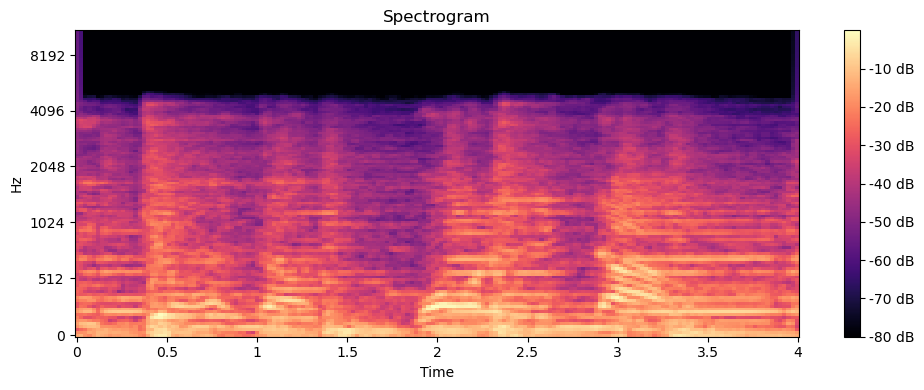

(128, 173)


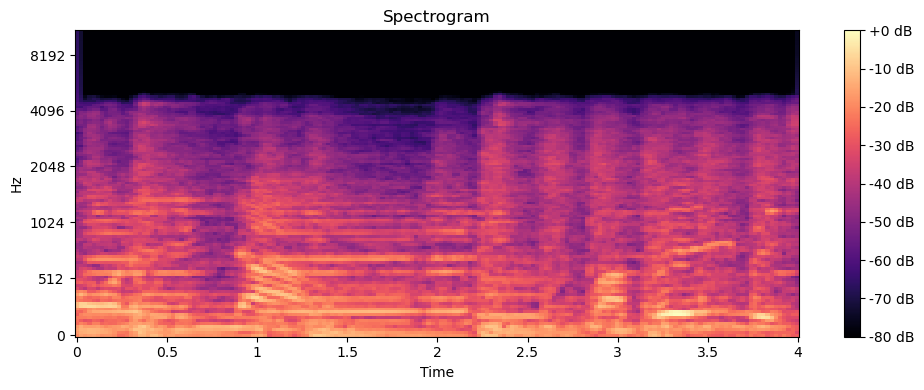

(128, 173)


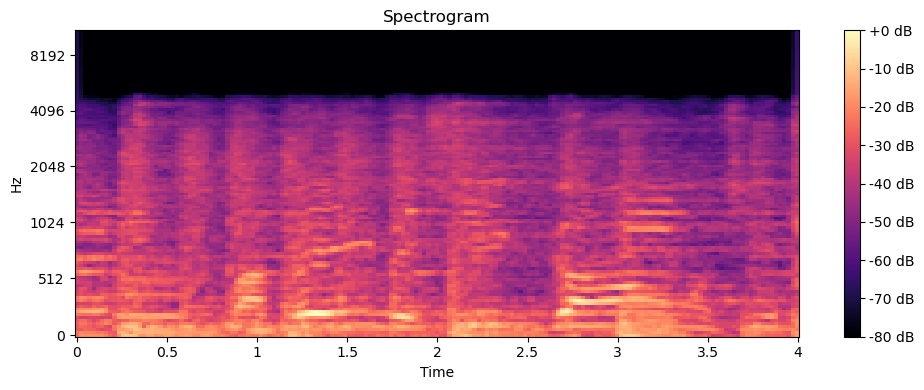

(128, 173)


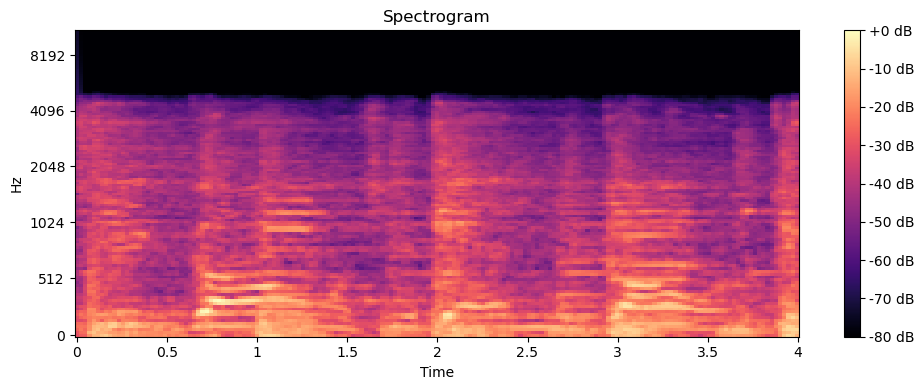

(128, 173)


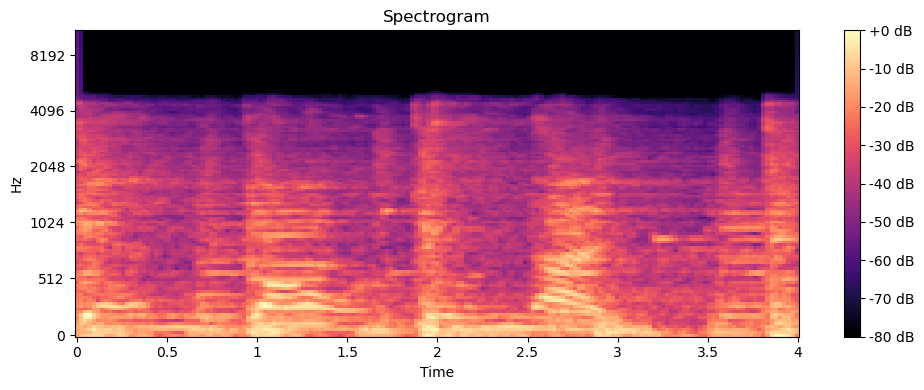

(128, 173)


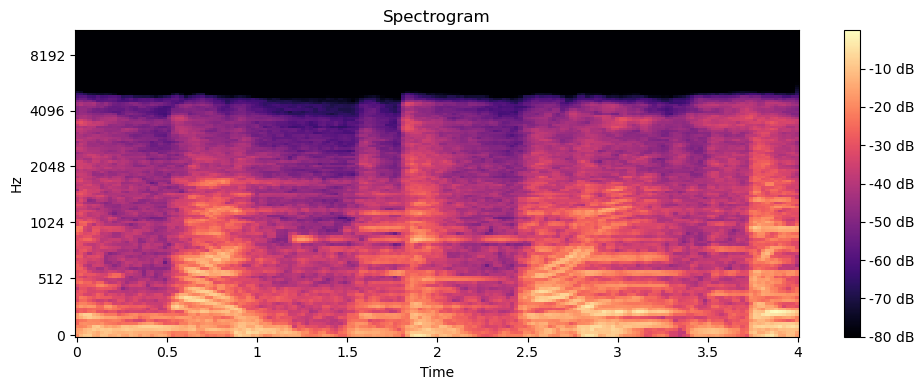

(128, 173)


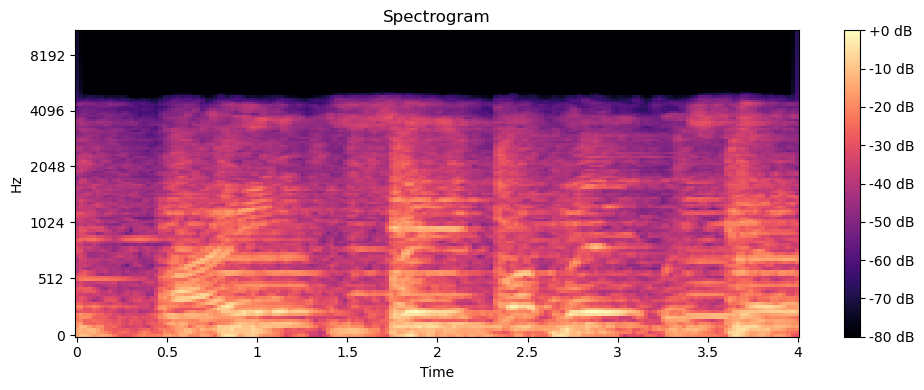

(128, 173)


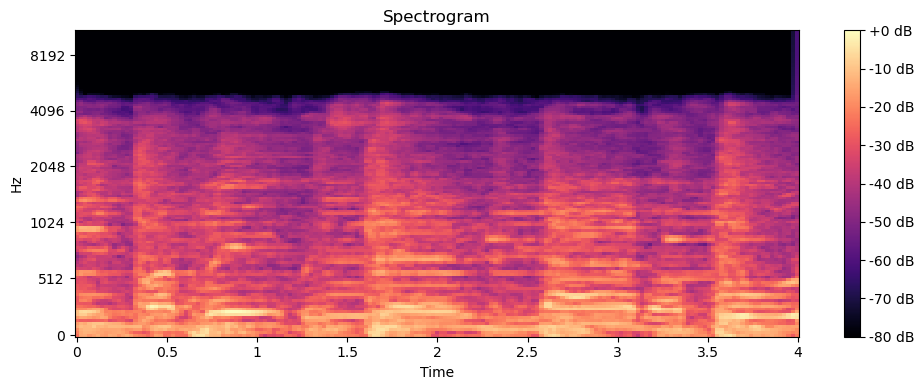

(128, 173)


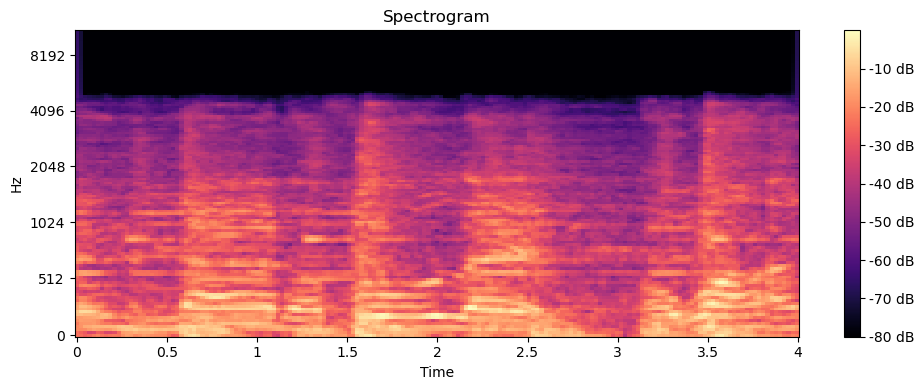

(128, 173)


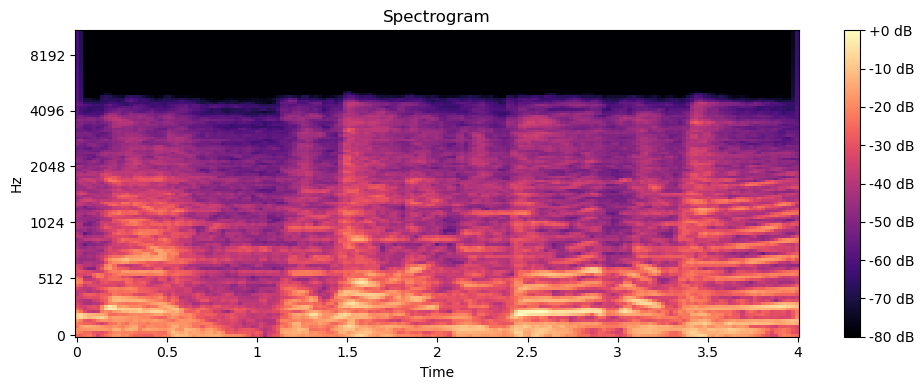

(128, 173)


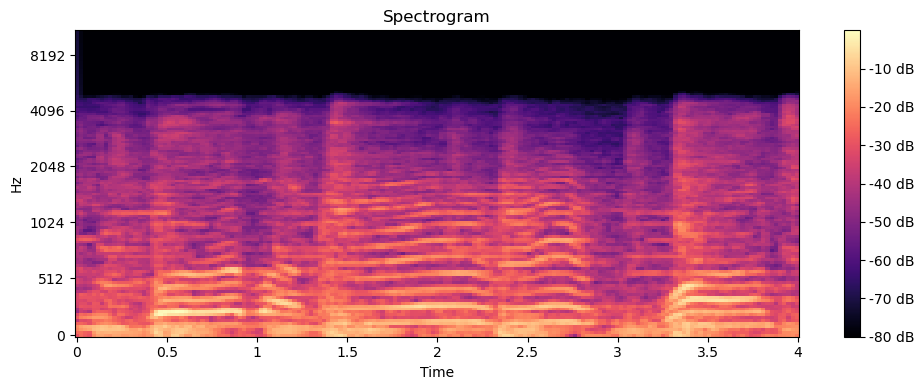

(128, 173)


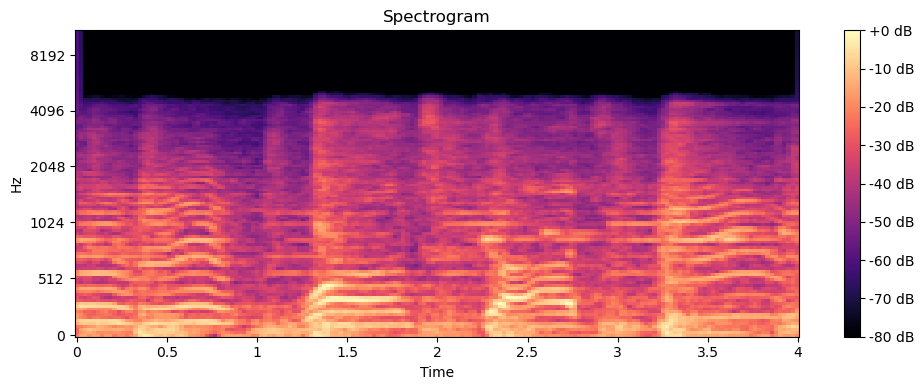

(128, 173)


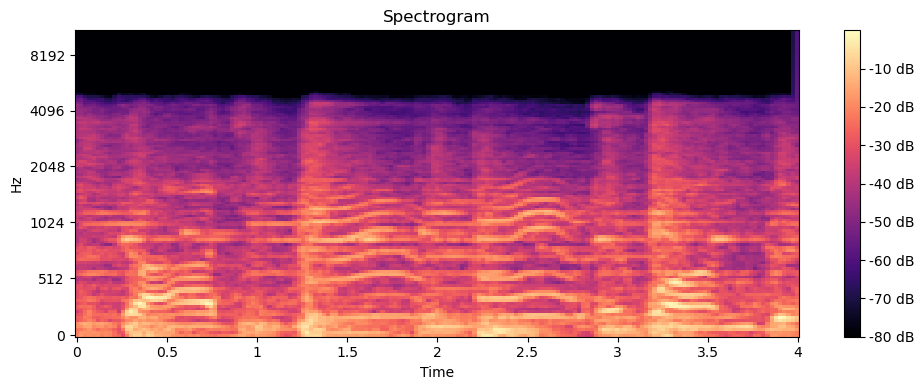

(128, 173)


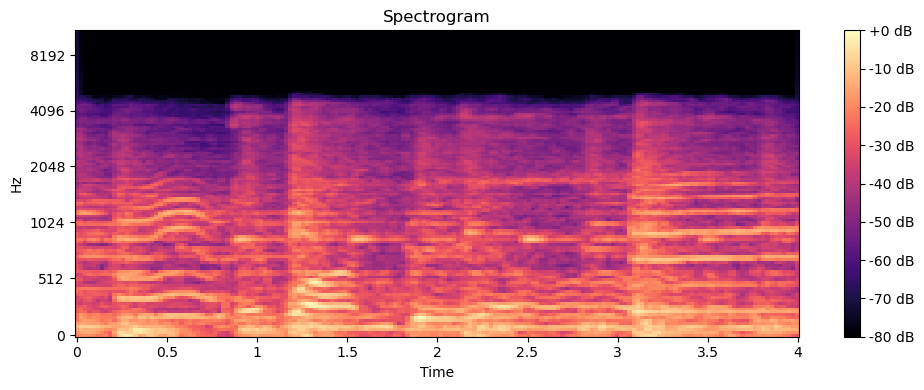

(128, 173)


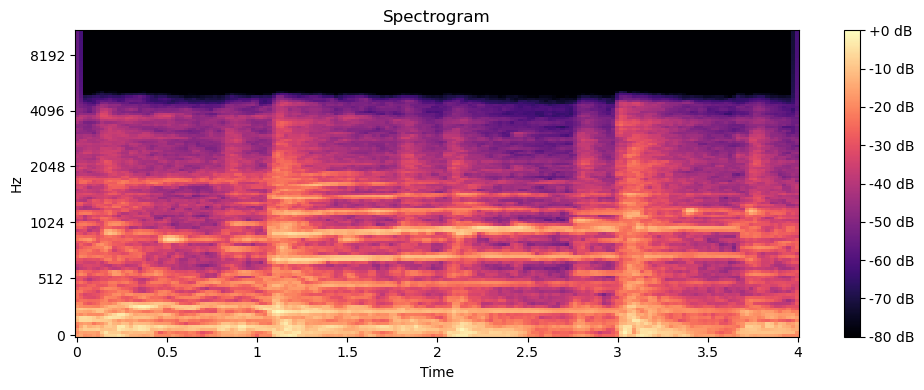

(128, 173)


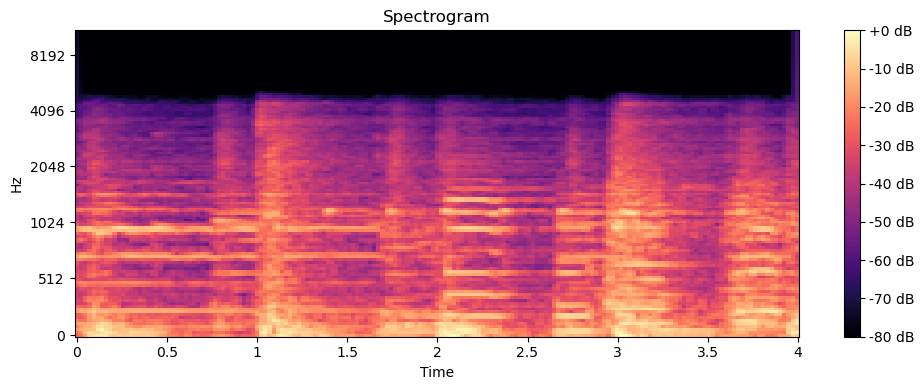

(128, 88)


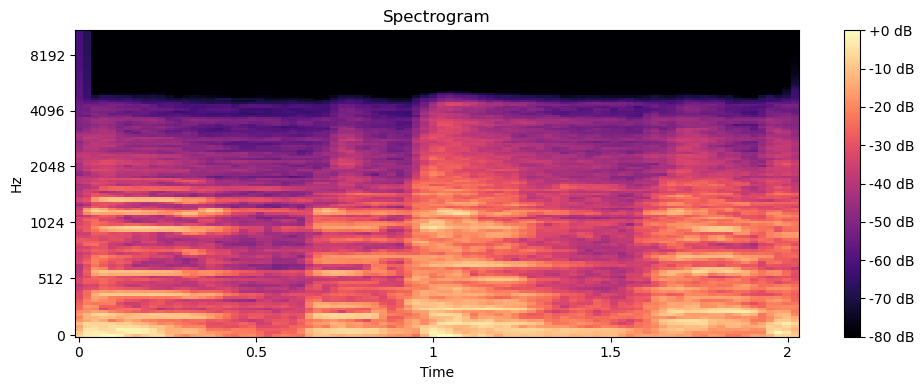

In [9]:
#Spectrogram of Audio chunks
plot_melspectrogram_chunks(y=x,sr=sr)

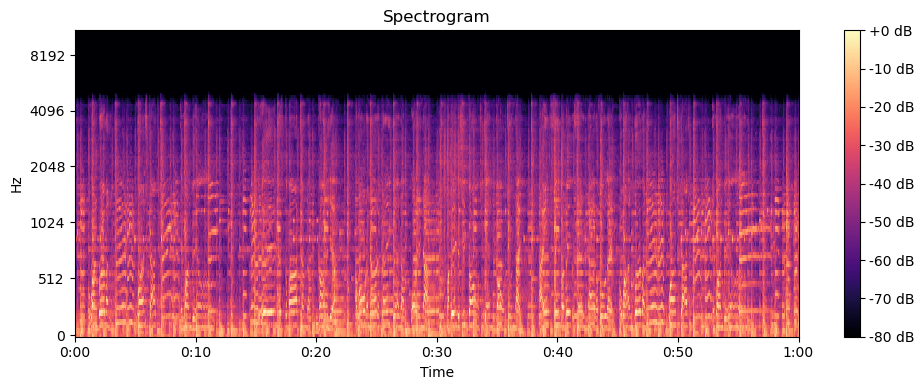

In [12]:
#Spectrogram of Entire audio
plot_melspectrogram(y=x,sr=sr)

### Data Preprocessing

In [13]:
# Define your folder structure
data_dir = r"C:\Users\SARIN\OneDrive\Desktop\Data\genres_original"
classes = ['blues', 'classical','country','disco','hiphop','metal','pop','reggae','rock']

In [14]:
# Load and preprocess audio data
def load_and_preprocess_data(data_dir, classes, target_shape=(150, 150)):
    data = []
    labels = []
    
    for i_class, class_name in enumerate(classes):
        class_dir = os.path.join(data_dir, class_name)
        print("Processing--",class_name)
        for filename in os.listdir(class_dir):
            if filename.endswith('.wav'):
                file_path = os.path.join(class_dir, filename)
                audio_data, sample_rate = librosa.load(file_path, sr=None)
                # Perform preprocessing (e.g., convert to Mel spectrogram and resize)
                # Define the duration of each chunk and overlap
                chunk_duration = 4  # seconds
                overlap_duration = 2  # seconds
                
                # Convert durations to samples
                chunk_samples = chunk_duration * sample_rate
                overlap_samples = overlap_duration * sample_rate
                
                # Calculate the number of chunks
                num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
                
                # Iterate over each chunk
                for i in range(num_chunks):
                    # Calculate start and end indices of the chunk
                    start = i * (chunk_samples - overlap_samples)
                    end = start + chunk_samples
                    
                    # Extract the chunk of audio
                    chunk = audio_data[start:end]
                    
                    # Compute the Mel spectrogram for the chunk
                    mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sr)
                    
                #mel_spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate)
                    mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape)
                    data.append(mel_spectrogram)
                    labels.append(i_class)
    
    return np.array(data), np.array(labels)

In [44]:
conda install ffmpeg

Retrieving notices: ...working... done
Solving environment: ...working... done

## Package Plan ##

  environment location: C:\Users\SARIN\anaconda3

  added / updated specs:
    - ffmpeg


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    cffi-1.16.0                |  py311h2bbff1b_1         313 KB
    h5py-3.11.0                |  py311h765d3d0_0         1.2 MB
    hdf5-1.12.1                |       h51c971a_3        11.9 MB
    pytables-3.8.0             |  py311h4671533_3         2.1 MB
    ------------------------------------------------------------
                                           Total:        15.5 MB

The following NEW packages will be INSTALLED:

  cffi               pkgs/main/win-64::cffi-1.16.0-py311h2bbff1b_1 
  h5py               pkgs/main/win-64::h5py-3.11.0-py311h765d3d0_0 
  pycparser          pkgs/main/noarch::pycparser-2.21-pyhd3eb1b0_0 

The following packages 

DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:https://repo.anaconda.com:443 "GET /pkgs/main/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:https://repo.anaconda.com:443 "GET /pkgs/msys2/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.util.retry:Incremented Retry for (url='/pkgs/r/notices.json'): Retry(total=2, connect=None, read=None, redirect=None, status=None)
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (2): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:https://repo.anaconda.com:443 "GET /pkgs/r/notices.json HTTP/1.1" 404 None
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connectionpool:Starting new HTTPS connection (1): repo.anaconda.com:443
DEBUG:urllib3.connec

In [15]:
# Split data into training and testing sets
data, labels = load_and_preprocess_data(data_dir, classes)
#print("\nData:",data,"\nlabel",labels)

Processing-- blues
Processing-- classical
Processing-- country
Processing-- disco
Processing-- hiphop
Processing-- metal
Processing-- pop
Processing-- reggae
Processing-- rock


In [16]:
data.shape

(13490, 150, 150, 1)

In [17]:
labels.shape

(13490,)

In [18]:
labels

array([0, 0, 0, ..., 8, 8, 8])

In [19]:
labels = to_categorical(labels, num_classes=len(classes))  # Convert labels to one-hot encoding
labels

array([[1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 1.]])

In [20]:
labels.shape

(13490, 9)

In [21]:
data.shape

(13490, 150, 150, 1)

### Splitting Dataset into Training and Test set

In [51]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.2, random_state=42)

## Building Model

In [52]:
model = tf.keras.models.Sequential()

In [53]:
X_train[0].shape

(150, 150, 1)

In [54]:
model.add(Conv2D(filters=32,kernel_size=3,padding='same',activation='relu',input_shape=X_train[0].shape))
model.add(Conv2D(filters=32,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [55]:
model.add(Conv2D(filters=64,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=64,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [56]:
model.add(Conv2D(filters=128,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=128,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [57]:
model.add(tf.keras.layers.Dropout(0.3))

In [58]:
model.add(Conv2D(filters=256,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=256,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [59]:
model.add(Conv2D(filters=512,kernel_size=3,padding='same',activation='relu'))
model.add(Conv2D(filters=512,kernel_size=3,activation='relu'))
model.add(MaxPool2D(pool_size=2,strides=2))

In [60]:
model.add(Dropout(0.3))

In [61]:
model.add(Flatten())

In [62]:
model.add(Dense(units=1200,activation='relu'))

In [63]:
model.add(Dropout(0.45))

In [64]:
#Output Layer
model.add(Dense(units=len(classes),activation='softmax'))

In [65]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 150, 150, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 148, 148, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 74, 74, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_15 (Conv2D)              │ (None, 72, 72, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 36, 36, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 34, 34, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 17, 17, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_18 (Conv2D)              │ (None, 17, 17, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 15, 15, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 7, 7, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 7, 7, 512)      │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_21 (Conv2D)              │ (None, 5, 5, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 2, 2, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1200)           │     2,458,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 1200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 9)              │        10,809 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,181,257 (27.39 MB)

 Trainable params: 7,181,257 (27.39 MB)

 Non-trainable params: 0 (0.00 B)

In [66]:
# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['accuracy'])

In [67]:
X_train.shape,y_train.shape

((10792, 150, 150, 1), (10792, 9))

In [68]:
# Train the model
training_history = model.fit(X_train, y_train, epochs=10, batch_size=32, validation_data=(X_test, y_test))

Epoch 1/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 250s 733ms/step - accuracy: 0.2151 - loss: 2.0397 - val_accuracy: 0.4396 - val_loss: 1.5466
Epoch 2/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 271s 803ms/step - accuracy: 0.4834 - loss: 1.4515 - val_accuracy: 0.5923 - val_loss: 1.1856
Epoch 3/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 239s 707ms/step - accuracy: 0.6058 - loss: 1.1328 - val_accuracy: 0.6642 - val_loss: 0.9827
Epoch 4/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 239s 708ms/step - accuracy: 0.6837 - loss: 0.9088 - val_accuracy: 0.7039 - val_loss: 0.8457
Epoch 5/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 259s 767ms/step - accuracy: 0.7200 - loss: 0.8079 - val_accuracy: 0.7246 - val_loss: 0.8009
Epoch 6/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 242s 717ms/step - accuracy: 0.7602 - loss: 0.6949 - val_accuracy: 0.7483 - val_loss: 0.7254
Epoch 7/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 251s 742ms/step - accuracy: 0.7965 - loss: 0.6072 - val_accuracy: 0.7613 - val_loss: 0.6876
Epoch 8/10
338/338 ━━━━━━━━━━━━━━━━━━━━ 240s 710ms/step - accuracy: 0.8216 -

In [69]:
model.save("Modified_Trainedmodel.keras") #Mac
model.save("Modified_Trainedmodel.h5") #Windows

In [70]:
training_history.history

{'accuracy': [0.283728688955307,
  0.5214974284172058,
  0.6271312236785889,
  0.6843958497047424,
  0.7244254946708679,
  0.7685322165489197,
  0.793365478515625,
  0.8214418292045593,
  0.8459970355033875,
  0.8710155487060547],
 'loss': [1.8902827501296997,
  1.3490095138549805,
  1.0679080486297607,
  0.9084311723709106,
  0.7900068759918213,
  0.681676983833313,
  0.6092939972877502,
  0.5228152275085449,
  0.4514763355255127,
  0.37662312388420105],
 'val_accuracy': [0.439584881067276,
  0.5922905802726746,
  0.664195716381073,
  0.7038546800613403,
  0.7246108055114746,
  0.7483320832252502,
  0.7613046765327454,
  0.8087472319602966,
  0.8350629806518555,
  0.8502594232559204],
 'val_loss': [1.5465826988220215,
  1.1855605840682983,
  0.982674777507782,
  0.8457397818565369,
  0.8008690476417542,
  0.7254229187965393,
  0.6875551342964172,
  0.549615204334259,
  0.5005961060523987,
  0.4430299401283264]}

In [71]:
#Recording History in json
import json
with open('train_history.json','w') as f:
  json.dump(training_history.history,f)

## Model Evaluation

In [72]:
##Model Evaluation on Training set

train_accuracy=model.evaluate(X_train,y_train,verbose=0)
print('Training set' ,train_accuracy[1])


Training set 0.9288361668586731


In [73]:
##Model Evaluation on Test set
test_accuracy=model.evaluate(X_test,y_test,verbose=0)
print('ACCURACY :' ,test_accuracy[1])


ACCURACY : 0.8502594232559204


## Accuracy and Loss Visualization

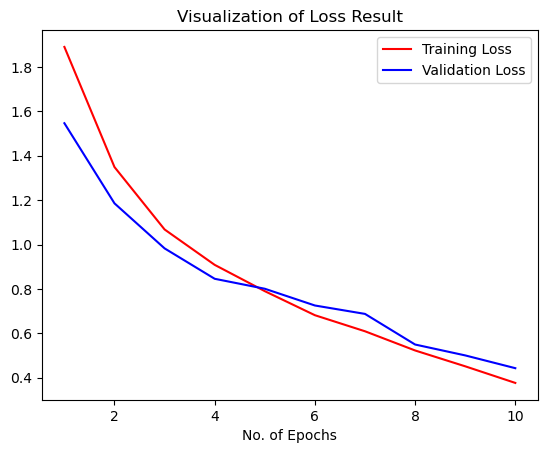

In [75]:
#Visualization of Loss
epochs = [i for i in range(1,11)]
plt.plot(epochs,training_history.history['loss'],color='red',label='Training Loss')
plt.plot(epochs,training_history.history['val_loss'],color='blue',label='Validation Loss')
plt.xlabel('No. of Epochs')
plt.title('Visualization of Loss Result')
plt.legend()
plt.show()

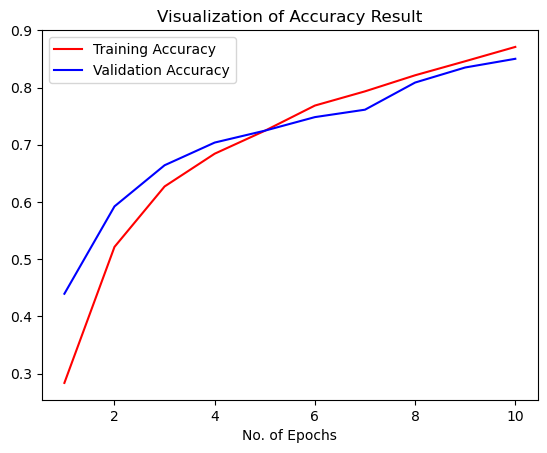

In [76]:
#Accuracy Visualization
plt.plot(epochs,training_history.history['accuracy'],color='red',label='Training Accuracy')
plt.plot(epochs,training_history.history['val_accuracy'],color='blue',label='Validation Accuracy')
plt.xlabel('No. of Epochs')
plt.title('Visualization of Accuracy Result')
plt.legend()
plt.show()

## Precision, Recall, Confusion Metrics calculation

In [77]:
y_pred = model.predict(X_test)
y_pred

85/85 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step


array([[3.9058556e-03, 3.5325609e-04, 9.6012551e-01, ..., 5.9274095e-03,
        3.7570111e-03, 2.5392003e-02],
       [5.2586015e-02, 4.7547246e-06, 8.0294075e-04, ..., 7.4202358e-04,
        5.6440130e-02, 2.0591218e-02],
       [6.0558170e-03, 2.6116570e-04, 9.5932114e-01, ..., 3.8853562e-03,
        2.6699884e-02, 3.4589665e-03],
       ...,
       [1.4796392e-07, 6.7343450e-08, 2.4346267e-07, ..., 8.9341217e-01,
        2.8924368e-04, 2.8100771e-05],
       [1.9697014e-04, 9.2495720e-05, 9.9218190e-01, ..., 1.6960151e-03,
        3.6163945e-04, 5.4294434e-03],
       [5.3851918e-04, 1.3412958e-05, 2.7466795e-04, ..., 2.5119051e-02,
        2.0879756e-04, 1.2188746e-02]], dtype=float32)

In [78]:
y_pred.shape

(2698, 9)

In [79]:
y_test.shape

(2698, 9)

In [80]:
predicted_categories = np.argmax(y_pred, axis=1)
predicted_categories

array([2, 3, 2, ..., 6, 2, 5], dtype=int64)

In [81]:
y_test

array([[0., 0., 1., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 0., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [82]:
true_categories = np.argmax(y_test, axis=1)
true_categories

array([2, 0, 2, ..., 6, 2, 5], dtype=int64)

In [83]:
classes

['blues',
 'classical',
 'country',
 'disco',
 'hiphop',
 'metal',
 'pop',
 'reggae',
 'rock']

In [84]:
from sklearn.metrics import confusion_matrix,classification_report
cm = confusion_matrix(true_categories,predicted_categories)
# Precision Recall F1score
print(classification_report(true_categories,predicted_categories,target_names=classes))

              precision    recall  f1-score   support

       blues       0.92      0.87      0.90       316
   classical       0.95      0.97      0.96       291
     country       0.80      0.80      0.80       326
       disco       0.83      0.91      0.87       289
      hiphop       0.88      0.89      0.89       295
       metal       0.86      0.90      0.88       298
         pop       0.87      0.81      0.84       318
      reggae       0.93      0.78      0.84       273
        rock       0.65      0.73      0.69       292

    accuracy                           0.85      2698
   macro avg       0.85      0.85      0.85      2698
weighted avg       0.85      0.85      0.85      2698



## Confusion Matrix Visualization

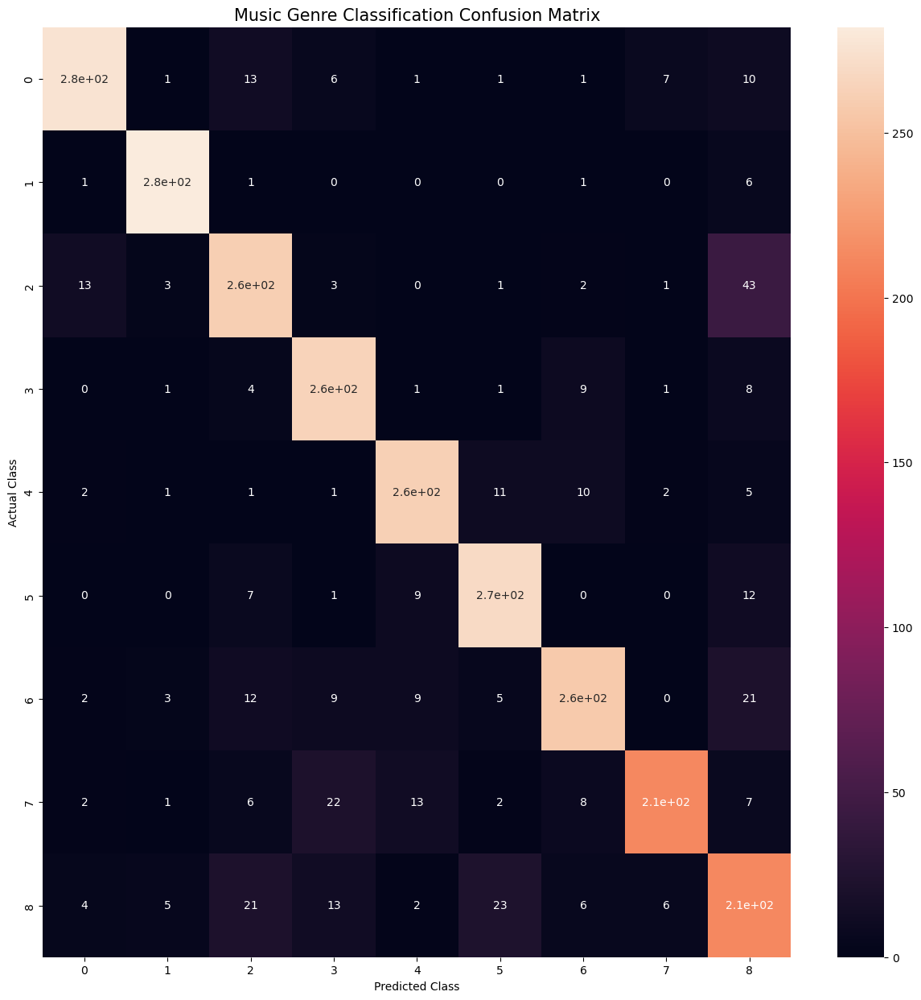

In [85]:
plt.figure(figsize=(15, 15))
sns.heatmap(cm,annot=True,annot_kws={"size": 10})

plt.xlabel('Predicted Class',fontsize = 10)
plt.ylabel('Actual Class',fontsize = 10)
plt.title('Music Genre Classification Confusion Matrix',fontsize = 15)
plt.show()

In [86]:
import os
import librosa
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.image import resize

In [87]:
#Loading Model
model = tf.keras.models.load_model("Modified_Trainedmodel.keras")

In [88]:
classes = ['blues', 'classical','country','disco','hiphop','metal','pop','reggae','rock']

In [89]:
# Load and preprocess audio data
def load_and_preprocess_data(file_path, target_shape=(150, 150)):
    data = []
    audio_data, sample_rate = librosa.load(file_path, sr=None)
    # Perform preprocessing (e.g., convert to Mel spectrogram and resize)
    # Define the duration of each chunk and overlap
    chunk_duration = 4  # seconds
    overlap_duration = 2  # seconds
                
    # Convert durations to samples
    chunk_samples = chunk_duration * sample_rate
    overlap_samples = overlap_duration * sample_rate
                
    # Calculate the number of chunks
    num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1
                
    # Iterate over each chunk
    for i in range(num_chunks):
                    # Calculate start and end indices of the chunk
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples
                    
                    # Extract the chunk of audio
        chunk = audio_data[start:end]
                    
                    # Compute the Mel spectrogram for the chunk
        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)
                    
                #mel_spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate)
        mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape)
        data.append(mel_spectrogram)
    
    return np.array(data)

In [90]:
pip install pydub

Note: you may need to restart the kernel to use updated packages.


In [127]:
import pyaudio
import wave
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from pydub import AudioSegment

FRAMES_PER_BUFFER = 3200
FORMAT = pyaudio.paInt16
CHANNELS = 1
RATE = 16000

pa = pyaudio.PyAudio()

stream = pa.open(
    format=FORMAT,
    channels=CHANNELS,
    rate=RATE,
    input=True,
    frames_per_buffer=FRAMES_PER_BUFFER
)

print('start recording')

seconds = 30
frames = []
second_tracking = 0
second_count = 0
for i in range(0, int(RATE/FRAMES_PER_BUFFER*seconds)):
    data = stream.read(FRAMES_PER_BUFFER)
    frames.append(data)
    second_tracking += 1
    if second_tracking == RATE/FRAMES_PER_BUFFER:
        second_count += 1
        second_tracking = 0
        print(f'Time Left: {seconds - second_count} seconds')


stream.stop_stream()
stream.close()
pa.terminate()

# Saving the recorded audio as a WAV file
wav_file = 'modified_audio.wav'
with wave.open(wav_file, 'wb') as wav:
    wav.setnchannels(CHANNELS)
    wav.setsampwidth(pa.get_sample_size(FORMAT))
    wav.setframerate(RATE)
    wav.writeframes(b''.join(frames))

# Converting the WAV file to MP3 format
mp3_file = 'modified_audio.mp3'
audio = AudioSegment.from_wav(wav_file)
audio.export(mp3_file, format="mp3")

print("Audio saved as MP3:", mp3_file)


start recording
Time Left: 29 seconds
Time Left: 28 seconds
Time Left: 27 seconds
Time Left: 26 seconds
Time Left: 25 seconds
Time Left: 24 seconds
Time Left: 23 seconds
Time Left: 22 seconds
Time Left: 21 seconds
Time Left: 20 seconds
Time Left: 19 seconds
Time Left: 18 seconds
Time Left: 17 seconds
Time Left: 16 seconds
Time Left: 15 seconds
Time Left: 14 seconds
Time Left: 13 seconds
Time Left: 12 seconds
Time Left: 11 seconds
Time Left: 10 seconds
Time Left: 9 seconds
Time Left: 8 seconds
Time Left: 7 seconds
Time Left: 6 seconds
Time Left: 5 seconds
Time Left: 4 seconds
Time Left: 3 seconds
Time Left: 2 seconds
Time Left: 1 seconds
Time Left: 0 seconds
Audio saved as MP3: modified_audio.mp3


In [128]:
from IPython.display import Audio
file_path = "modified_audio.mp3"
y, sr = librosa.load(file_path, sr=44100)
Audio(data=y, rate=sr)

In [129]:
#Processing Test File
X_test = load_and_preprocess_data(file_path)

In [130]:
#Model Prediction
def model_prediction(X_test):
    y_pred = model.predict(X_test)
    predicted_categories = np.argmax(y_pred,axis=1)
    unique_elements, counts = np.unique(predicted_categories, return_counts=True)
    #print(unique_elements, counts)
    max_count = np.max(counts)
    max_elements = unique_elements[counts == max_count]
    return max_elements[0]

In [131]:
#Model Prediction
c_index = model_prediction(X_test)
print(f"Model Prediction :: Music Genre --> {classes[c_index]}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step
Model Prediction :: Music Genre --> classical
